# ***Análisis*** ***Exploratorio*** ***del Dataset*** ***Properatti*** ***-*** ***Desafío*** ***Nº*** ***1***

### Integrantes Equipo Nº 6: Bertero, Josías - Negri, Raúl - Pelicaric, Iván - Silva, Emiliano

***

#### Se importan las librerias a utilizar.

In [53]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import re

#### Se realiza lectura del CSV y se presentan las primeras cinco filas del dataset y todas sus columnas.

In [54]:
data = pd.read_csv('properatti.csv', sep=",") 

Se crea una copia del dataframe para posterior tratamiento

In [55]:
dfc = data.copy()

In [56]:
data.head(5)

,Unnamed: 0,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,...,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail
0,0,sell,PH,Mataderos,|Argentina|Capital Federal|Mataderos|,Argentina,Capital Federal,3430787.0,"-34.6618237,-58.5088387",-34.661824,...,40.0,1127.272727,1550.000000,NaN,NaN,NaN,http://www.properati.com.ar/15bo8_venta_ph_mat...,"2 AMBIENTES TIPO CASA PLANTA BAJA POR PASILLO,...",2 AMB TIPO CASA SIN EXPENSAS EN PB,https://thumbs4.properati.com/8/BluUYiHJLhgIIK...
1,1,sell,apartment,La Plata,|Argentina|Bs.As. G.B.A. Zona Sur|La Plata|,Argentina,Bs.As. G.B.A. Zona Sur,3432039.0,"-34.9038831,-57.9643295",-34.903883,...,NaN,NaN,NaN,NaN,NaN,NaN,http://www.properati.com.ar/15bob_venta_depart...,Venta de departamento en décimo piso al frente...,VENTA Depto 2 dorm. a estrenar 7 e/ 36 y 37 ...,https://thumbs4.properati.com/7/ikpVBu2ztHA7jv...
2,2,sell,apartment,Mataderos,|Argentina|Capital Federal|Mataderos|,Argentina,Capital Federal,3430787.0,"-34.6522615,-58.5229825",-34.652262,...,55.0,1309.090909,1309.090909,NaN,NaN,NaN,http://www.properati.com.ar/15bod_venta_depart...,2 AMBIENTES 3ER PISO LATERAL LIVING COMEDOR AM...,2 AMB 3ER PISO CON ASCENSOR APTO CREDITO,https://thumbs4.properati.com/5/SXKr34F_IwG3W_...
3,3,sell,PH,Liniers,|Argentina|Capital Federal|Liniers|,Argentina,Capital Federal,3431333.0,"-34.6477969,-58.5164244",-34.647797,...,NaN,NaN,NaN,NaN,NaN,NaN,http://www.properati.com.ar/15boh_venta_ph_lin...,PH 3 ambientes con patio. Hay 3 deptos en lote...,PH 3 amb. cfte. reciclado,https://thumbs4.properati.com/3/DgIfX-85Mog5SP...
4,4,sell,apartment,Centro,|Argentina|Buenos Aires Costa Atlántica|Mar de...,Argentina,Buenos Aires Costa Atlántica,3435548.0,"-38.0026256,-57.5494468",-38.002626,...,35.0,1828.571429,1828.571429,NaN,NaN,NaN,http://www.properati.com.ar/15bok_venta_depart...,DEPARTAMENTO CON FANTÁSTICA ILUMINACIÓN NATURA...,DEPTO 2 AMB AL CONTRAFRENTE ZONA CENTRO/PLAZA ...,https://thumbs4.properati.com/5/xrRqlNcSI_vs-f...


***

## Se realizan estudios generales sobre el dataset.

### El dataset consta de 121220 filas por 26 columnas.

In [57]:
data.shape

(121220, 26)

### Se visualiza los tipos de datos que contiene cada columna.

In [58]:
data.dtypes

Unnamed: 0                      int64
operation                      object
property_type                  object
place_name                     object
place_with_parent_names        object
country_name                   object
state_name                     object
geonames_id                   float64
lat-lon                        object
lat                           float64
lon                           float64
price                         float64
currency                       object
price_aprox_local_currency    float64
price_aprox_usd               float64
surface_total_in_m2           float64
surface_covered_in_m2         float64
price_usd_per_m2              float64
price_per_m2                  float64
floor                         float64
rooms                         float64
expenses                      float64
properati_url                  object
description                    object
title                          object
image_thumbnail                object
dtype: objec

### Porcentaje de nulos por cada columna del dataset.

In [59]:
porcentaje_nulos = ((data.isnull().sum()/data.shape[0])*100).round(2)

In [60]:
print(porcentaje_nulos)

Unnamed: 0                     0.00
operation                      0.00
property_type                  0.00
place_name                     0.02
place_with_parent_names        0.00
country_name                   0.00
state_name                     0.00
geonames_id                   15.44
lat-lon                       42.53
lat                           42.53
lon                           42.53
price                         16.84
currency                      16.84
price_aprox_local_currency    16.84
price_aprox_usd               16.84
surface_total_in_m2           32.44
surface_covered_in_m2         16.42
price_usd_per_m2              43.39
price_per_m2                  27.69
floor                         93.48
rooms                         60.91
expenses                      88.23
properati_url                  0.00
description                    0.00
title                          0.00
image_thumbnail                2.57
dtype: float64


***

# Análisis por columnas para explorar los datos

## Para el modelo de predicción de precios por metro cuadrado se utiliza el siguiente diagrama de procesos.

<img src = "Proceso_DS.JPG">

***

### Análisis de la columna "State Name" o "Provincia".

***

### Observación de la columna Precio Aproximado en USD.

Se realiza visualizacion de la variable sin realizar ningun filtrado

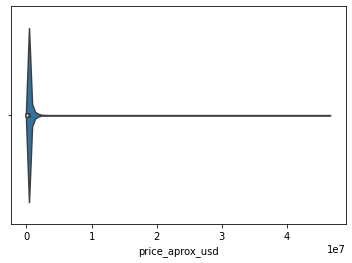

In [61]:
ax = sns.violinplot(x=data['price_aprox_usd'])

Se realiza una descrpción de la variable y luego se aplica máscara boleana para eliminar outliers

In [62]:
data['price_aprox_usd'].describe()

count    1.008100e+05
mean     2.397006e+05
std      3.913239e+05
min      0.000000e+00
25%      8.973388e+04
50%      1.450000e+05
75%      2.650000e+05
max      4.654544e+07
Name: price_aprox_usd, dtype: float64

Filtrado de precios mayores a 500000 USD y menores a 10000 USD, por considerarse fuera de los valores normales del mercado inmobiliario (fuente: https://www.buenosaires.gob.ar/sites/gcaba/files/enero16.pdf).

In [63]:
price_mask = (data['price_aprox_usd']<5.00000e+05) & (data['price_aprox_usd']>1.00000e+04)

In [64]:
data_price = data.loc[price_mask, :]
data_price['price_aprox_usd'].describe()

count     91659.000000
mean     166532.017832
std      106125.295369
min       10038.970000
25%       85000.000000
50%      132990.000000
75%      220000.000000
max      499999.000000
Name: price_aprox_usd, dtype: float64

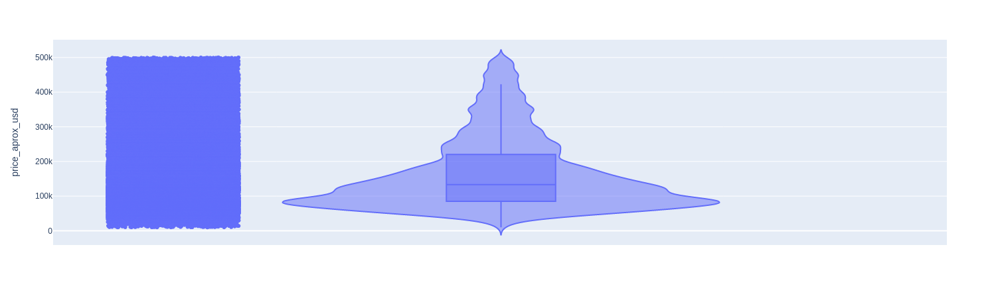

In [65]:
fig_bx = px.violin(data_price, y="price_aprox_usd", box=True, points='all')
fig_bx.show()

***

### Indagación en la columna "Surface covered in M2" o "Metros cuadrados cubiertos" de la propiedad.

In [66]:
data['surface_covered_in_m2'].describe()

count    101313.000000
mean        133.050181
std         724.351479
min           0.000000
25%          45.000000
50%          75.000000
75%         150.000000
max      187000.000000
Name: surface_covered_in_m2, dtype: float64

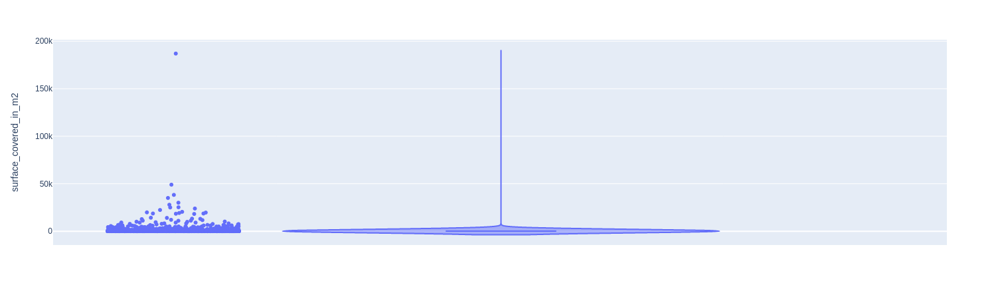

In [67]:
fig_sc = px.violin(data,y = 'surface_covered_in_m2', box=True, points='all')
fig_sc.show()

In [68]:
data_sc_mask = (data['surface_covered_in_m2'] > 9) & (data['surface_covered_in_m2'] < 1000)
data_sc = data.loc[data_sc_mask, :]

In [69]:
data_sc['surface_covered_in_m2'].describe()

count    100454.000000
mean        117.137794
std         110.272361
min          10.000000
25%          45.000000
50%          75.000000
75%         150.000000
max         993.000000
Name: surface_covered_in_m2, dtype: float64

Se busca el dato de max que brindó la función describe(), para entender el contexto del dato. Se observa que el tipo de propiedad es un local de Barrio Norte que posee casi 1000 m2 de superficie cubierta, lo cual da un valor de venta de aproximadamente 1.700.000 USD. Este valor estaría prefiltado por la máscara de precio.

In [70]:
data_sc.loc[data_sc['surface_covered_in_m2'] == 993.0]

,Unnamed: 0,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,...,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail
18015,18015,sell,store,Barrio Norte,|Argentina|Capital Federal|Barrio Norte|,Argentina,Capital Federal,3436109.0,NaN,NaN,...,993.0,1711.983887,1711.983887,NaN,NaN,NaN,http://www.properati.com.ar/174sc_alquiler_loc...,"LOCALVenta de edificio en Barrio Norte, Capita...",LOCAL EN VENTA,https://thumbs4.properati.com/5/UfWGtHgrMJBMHQ...


Se crea una nueva máscara para la superficie cubierta.

In [71]:
data_sc_mask2 = (data['surface_covered_in_m2'] > 9) & (data['surface_covered_in_m2'] < 501)
data_sc2 = data.loc[data_sc_mask2, :]

In [72]:
data_sc2['surface_covered_in_m2'].describe()

count    99182.000000
mean       110.392551
std         92.544288
min         10.000000
25%         45.000000
50%         74.000000
75%        147.000000
max        500.000000
Name: surface_covered_in_m2, dtype: float64

In [73]:
fig_dfscm = px.violin(data_sc2, y="surface_covered_in_m2", box=True, points='all')
fig_dfscm.show()

***

### Investigación de los datos de la columna "Surface total in M2" o "Superficie total en M2" de la propiedad.

In [74]:
data['surface_total_in_m2'].describe()

count     81892.000000
mean        233.795328
std        1782.222147
min           0.000000
25%          50.000000
50%          84.000000
75%         200.000000
max      200000.000000
Name: surface_total_in_m2, dtype: float64

***

### Estudio de la columna "Rooms" o "Número de Habitaciones" que posee la propiedad.

In [75]:
data['rooms'].unique()

array([nan,  1.,  4.,  3.,  2.,  6.,  5., 10.,  7.,  9.,  8., 17., 22.,
       15., 12., 11., 14., 16., 20., 13., 25., 19., 30., 18., 32., 24.,
       31., 21., 29., 27., 23., 28.])

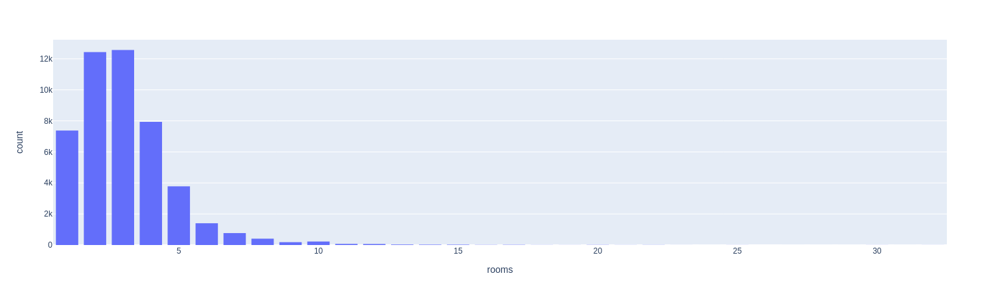

In [76]:
fig_r1 = px.histogram(data, x="rooms")
fig_r1.update_layout(bargap=0.2)
fig_r1.show()

Como se puede observar, no debería haber en la serie, propiedades con un número de habitaciones mayores a 10

Se eliminarán los NaN y los valores por mayores o iguales a 10

In [77]:
rooms_mask = data['rooms'] <= 10
data_rooms = data.loc[rooms_mask, :].dropna(subset=['rooms'])

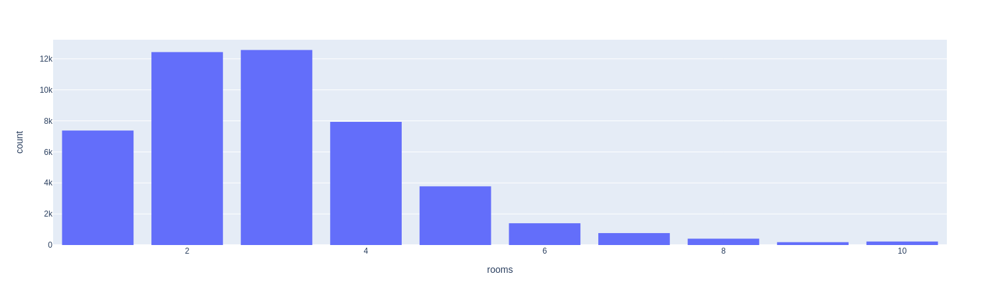

In [78]:
fig_r2 = px.histogram(data_rooms, x="rooms")
fig_r2.update_layout(bargap=0.2)
fig_r2.show()

***

### Observación de los datos de la columna "Property Type" o "Tipos de propiedades".

Valores unicos

In [79]:
data['property_type'].unique()

array(['PH', 'apartment', 'house', 'store'], dtype=object)

Cantidad de propiedades por tipos

In [80]:
data['property_type'].value_counts()

apartment    71065
house        40268
PH            5751
store         4136
Name: property_type, dtype: int64

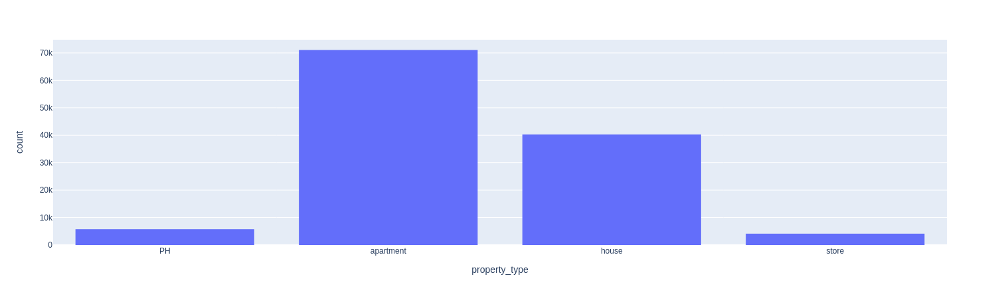

In [81]:
fig_rpt = px.histogram(data, x="property_type")
fig_rpt.update_layout(bargap=0.2)
fig_rpt.show()

***

# Análisis del dataframe 

## Se realiza

In [82]:
data_price = dfc.price_aprox_usd

In [83]:
data_f1 = data_price.apply(lambda x: np.NaN if (x > 500000) else np.NaN if (x < 10000) else x)

In [84]:
data_f1.describe()

count     91938.000000
mean     167533.318350
std      107531.256618
min       10000.000000
25%       85000.000000
50%      134000.000000
75%      222217.380000
max      500000.000000
Name: price_aprox_usd, dtype: float64

In [85]:
df = dfc.loc[:,['state_name', 'property_type', 'surface_covered_in_m2', 'surface_total_in_m2', 'rooms']]

In [86]:
df['price'] = data_f1

In [87]:
data_pfz = df.dropna()

In [88]:
data_pfz

,state_name,property_type,surface_covered_in_m2,surface_total_in_m2,rooms,price
13,Capital Federal,apartment,30.0,50.0,1.0,111700.0
14,Capital Federal,apartment,31.0,42.0,1.0,147900.0
16,Capital Federal,PH,98.0,140.0,4.0,239000.0
17,Bs.As. G.B.A. Zona Norte,apartment,78.0,176.0,3.0,315000.0
19,Capital Federal,apartment,96.0,104.0,3.0,350000.0
...,...,...,...,...,...,...
120202,Buenos Aires Costa Atlántica,PH,200.0,70.0,3.0,50000.0
120203,Buenos Aires Costa Atlántica,apartment,39.0,39.0,2.0,74000.0
120204,Buenos Aires Costa Atlántica,apartment,27.0,27.0,1.0,45000.0
120205,Buenos Aires Costa Atlántica,apartment,129.0,149.0,5.0,349000.0


In [89]:
datapt = data_pfz.pivot_table(data_pfz, index=["state_name"], aggfunc = np.mean)
datapt

,price,rooms,surface_covered_in_m2,surface_total_in_m2
state_name,,,,
Bs.As. G.B.A. Zona Norte,182707.071424,2.736334,86.003800,173.888629
Bs.As. G.B.A. Zona Oeste,142248.890330,3.133744,106.755456,198.405148
Bs.As. G.B.A. Zona Sur,135275.322066,2.830652,84.760373,156.285351
Buenos Aires Costa Atlántica,140425.413498,2.915900,110.346912,205.192641
Buenos Aires Interior,137659.469574,4.130045,146.152466,707.459641
Capital Federal,176545.913108,2.519839,66.230666,76.358776
Catamarca,160000.000000,3.000000,130.000000,1100.000000
Chaco,153712.361818,4.818182,128.090909,238.727273
Chubut,188441.546250,2.875000,101.125000,1360.625000


In [90]:
#datapt = data.pivot_table(data, index=["rooms", "property_type"])
#data.groupby(['property_type']).agg(avgprice=('price_aprox_usd','mean'))
#gk = data.groupby('property_type')
#gk.first()
#agg_func_math = {'price_aprox_usd': ['sum', 'mean', 'median', 'min', 'max']}
#data.groupby(['property_type']).agg(agg_func_math).round(2)
#df = data.loc[:,['state_name', 'surface_covered_in_m2', 'surface_total_in_m2', 'rooms', 'price_aprox_usd']]
#df.to_csv('file_name.csv', sep=',', index=False, encoding='utf-8')